Today we live in a time of graciously pre-trained models that allow you to run prototypes of computer vision projects without training your own models, without collecting data (there are many open datasets), without wasting time for labeling (there are many labeled data too), and without spending on resources (models are already pre-trained on a large data sets). And they work very well!


<p align='center'>
  <img src='https://drive.google.com/uc?export=view&id=1UxKDswPZrT02-az75Egg7BUknl5j4SN1'>
</p>

Let's look at an example from the [mmdetection](https://github.com/open-mmlab/mmdetection 'Mmdetection Github') library.
* Configs are [here](https://github.com/open-mmlab/mmdetection/tree/master/configs 'mmdetection/configs'), right now we need [here](https://github.com/open-mmlab/mmdetection/blob/master/configs/faster_rcnn_x101_64x4d_fpn_1x.py 'faster_rcnn_x101_64x4d_fpn_1x');
* Pre-trained models are [here](https://github.com/open-mmlab/mmdetection/blob/master/MODEL_ZOO.md 'MODEL_ZOO').

#### Upd. Configs were updated by mmdet creators, so if you want this example work, use configs from this folder: `configs/faster_rcnn_x101_64x4d_fpn_1x.py`.

In [1]:
import os

# Create folders where files will be downloaded.
config_path = 'configs/'
os.makedirs(os.path.dirname(config_path), exist_ok=True)
model_path = 'models/'
os.makedirs(os.path.dirname(model_path), exist_ok=True)

# Download files
# Config will have to be downloaded manually
# Pre-trained weights can be downloaded automatically
!wget https://s3.ap-northeast-2.amazonaws.com/open-mmlab/mmdetection/models/faster_rcnn_x101_64x4d_fpn_1x_20181218-c9c69c8f.pth -O models/faster_rcnn_x101_64x4d_fpn_1x.pth

--2019-08-18 14:11:17--  https://s3.ap-northeast-2.amazonaws.com/open-mmlab/mmdetection/models/faster_rcnn_x101_64x4d_fpn_1x_20181218-c9c69c8f.pth
Resolving s3.ap-northeast-2.amazonaws.com (s3.ap-northeast-2.amazonaws.com)... 52.219.60.97
Connecting to s3.ap-northeast-2.amazonaws.com (s3.ap-northeast-2.amazonaws.com)|52.219.60.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 399529653 (381M) [application/x-www-form-urlencoded]
Saving to: ‘models/faster_rcnn_x101_64x4d_fpn_1x.pth’

models/faster_rcnn_ 100%[===================>] 381.02M  1.53MB/s    in 2m 19s  

2019-08-18 14:13:37 (2.75 MB/s) - ‘models/faster_rcnn_x101_64x4d_fpn_1x.pth’ saved [399529653/399529653]



In [2]:
from mmdet.apis import init_detector, inference_detector

# Standard output of images from mmdetection is slightly rewritten for some flexibility
from utils.viz import show_result

config_file = config_path+'faster_rcnn_x101_64x4d_fpn_1x.py'
checkpoint_file = model_path+'faster_rcnn_x101_64x4d_fpn_1x.pth'

# Loading the model from the config and saved checkpoint, inference to GPU
model = init_detector(config_file, checkpoint_file, device='cuda:0')

In [3]:
# Download some pictures to test the model

img_path = 'imgs/'
os.makedirs(os.path.dirname(img_path), exist_ok=True)

!wget https://t2.ea.ltmcdn.com/en/images/8/7/3/img_5_hairless_cat_breeds_2378_600.jpg -O imgs/sphynx.png
!wget https://economia.me/i/2019/03/appliances-cabin-island-house-modern-kitchen-and-gloss-cabinets-cottage-pictures-da-color-white-rustic-small-wood-country-design-photos-beach-floors-grey-images-log-decorating.jpg -O imgs/kitchen.jpg

--2019-08-18 11:57:11--  https://t2.ea.ltmcdn.com/en/images/8/7/3/img_5_hairless_cat_breeds_2378_600.jpg
Resolving t2.ea.ltmcdn.com (t2.ea.ltmcdn.com)... 89.187.165.7
Connecting to t2.ea.ltmcdn.com (t2.ea.ltmcdn.com)|89.187.165.7|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 37121 (36K) [image/jpeg]
Saving to: ‘imgs/sphynx.png’

imgs/sphynx.png     100%[===================>]  36.25K  --.-KB/s    in 0.01s   

2019-08-18 11:57:12 (3.45 MB/s) - ‘imgs/sphynx.png’ saved [37121/37121]

--2019-08-18 11:57:12--  https://economia.me/i/2019/03/appliances-cabin-island-house-modern-kitchen-and-gloss-cabinets-cottage-pictures-da-color-white-rustic-small-wood-country-design-photos-beach-floors-grey-images-log-decorating.jpg
Resolving economia.me (economia.me)... 2606:4700:30::681b:90da, 2606:4700:30::681b:91da, 104.27.145.218, ...
Connecting to economia.me (economia.me)|2606:4700:30::681b:90da|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 73169

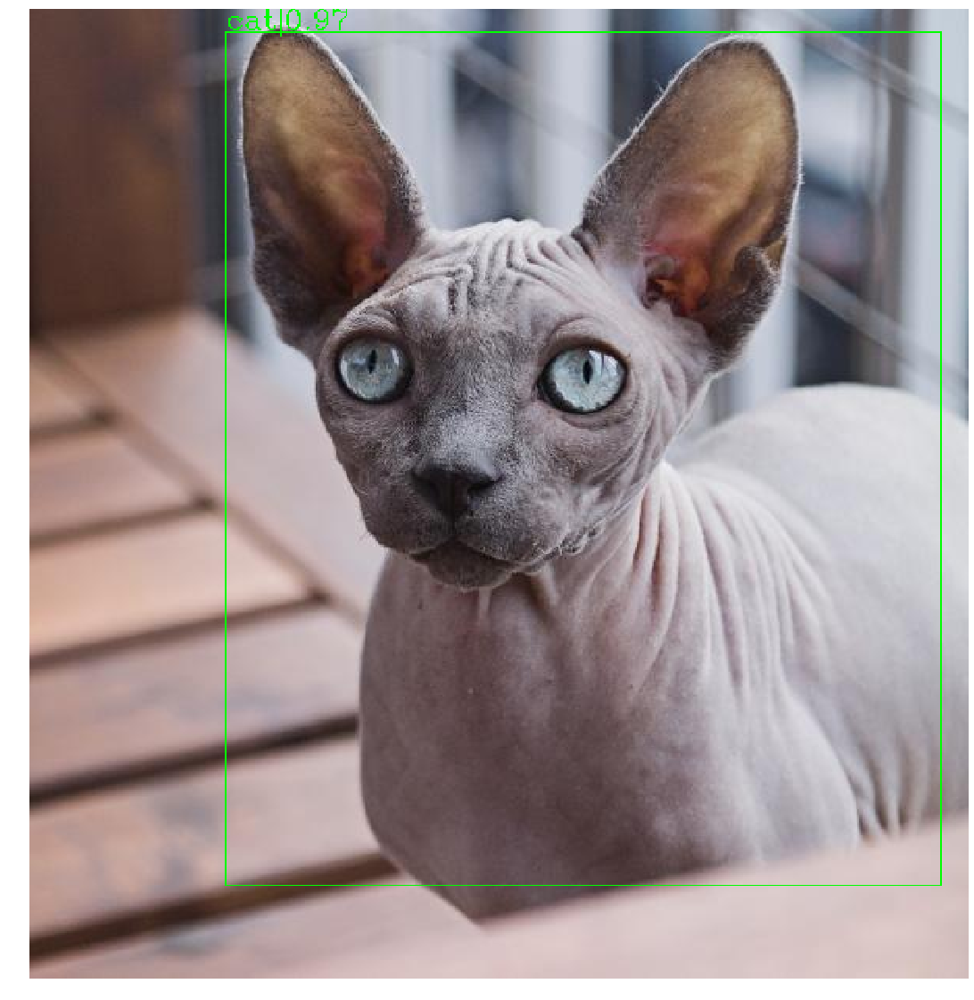

In [4]:
img = 'imgs/sphynx.png'
result = inference_detector(model, img)
show_result(img, result, model.CLASSES, score_thr=0.7, font_scale=.6, thickness=1, show_mask=False)

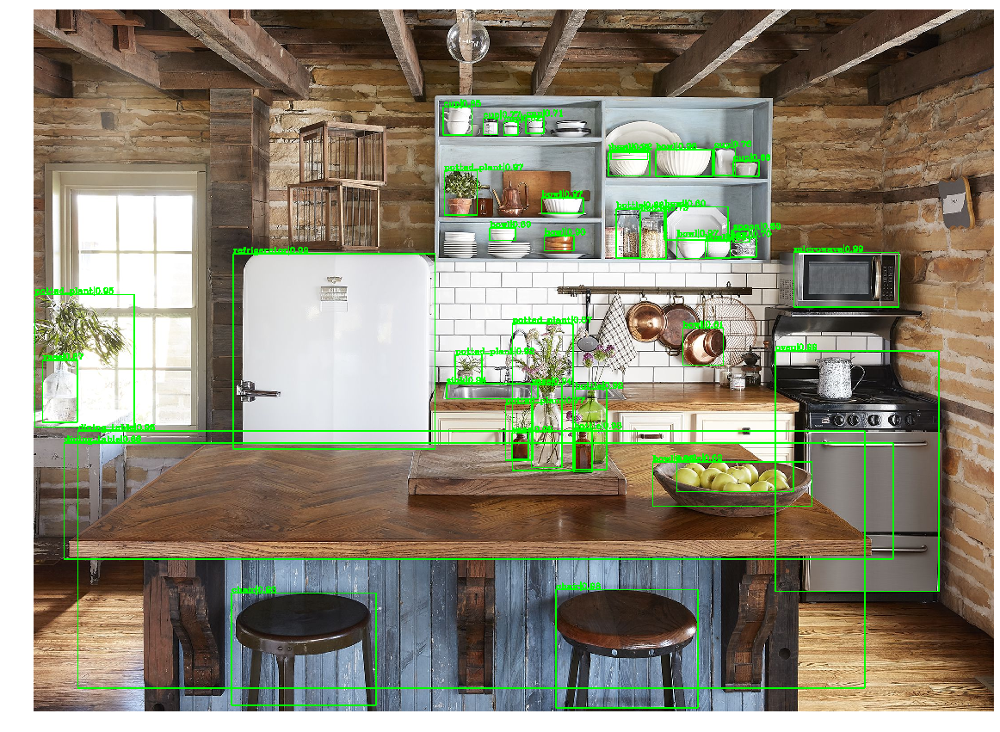

In [5]:
img = 'imgs/kitchen.jpg'
result = inference_detector(model, img)
show_result(img, result, model.CLASSES, score_thr=0.5, font_scale=.6, thickness=2, show_mask=False)

But the main problem is that pre-trained models can recognize only those classes in which they, in fact, were trained. Therefore, with the help of such models you can easily detect people, cars, some kitchen utensils or, say, kitties in pictures, but other classes will not be detected. Available classes from the MS-COCO dataset can be viewed using the command: `model.CLASSES`.

Then transfer learning comes to your aid, allowing you to retrain existing models on a small amount of your data.

Imagine that you need to distinguish between otters, pandas, raccoons and squirrels. A typical computer vision problem.

The first question is, where to get the data? Yes, not just pictures, but labeled pictures. Once again, ready-made open data comes to the rescue.

We will use the [OIDv4_ToolKit](https://github.com/EscVM/OIDv4_ToolKit 'OIDv4_ToolKit Github') library\*, which provides a convenient interface for working with data from [Open Image Dataset](https://storage.googleapis.com/openimages/web/index.html 'Open Image Dataset'). 

Why oid? Because it is about 9 million pictures with almost 16 million labeled boxes in 600 categories.

To download the train from the terminal, run the command:

```python3 OIDv4_ToolKit/main.py downloader --classes Otter Panda Raccoon Squirrel --type_csv train --multiclasses 1 --limit 600```

For validation, replace the word `train` with `validation`, for the test - with `test`.

\* So far, only the 4th version of the dataset is supported, but the developers promise the 5th.

Next, you need to decide which model we will train.  [Faster rcnn with resnet-50 as a backbone](https://github.com/open-mmlab/mmdetection/blob/master/configs/faster_rcnn_r50_fpn_1x.py 'faster_rcnn_r50_fpn_1x') would be a good choice: it is fairly accurate and trains faster than heavier grids. Download the [config](https://github.com/open-mmlab/mmdetection/blob/master/configs/faster_rcnn_r50_fpn_1x.py 'faster_rcnn_r50_fpn_1x').

Next, you need to properly format the annotations so that mmdetection understands what to do with them.

Class numbers should be continuous and begin with 1.

In [6]:
label_dict = {'Otter':1, 'Panda':2, 'Raccoon':3, 'Squirrel': 4}

In [7]:
from utils.make_annot import annot

path_to_OID_train_imgs = '/home/myltykritik/OID/Dataset/train/Otter_Panda_Raccoon_Squirrel/'
path_to_OID_valid_imgs = '/home/myltykritik/OID/Dataset/validation/Otter_Panda_Raccoon_Squirrel/'

annot(path_to_OID_train_imgs, label_dict, train_data=True)
annot(path_to_OID_valid_imgs, label_dict, train_data=False)

Annot train ready: ./annotations_train.pkl, len 1969
Annot val ready: ./annotations_val.pkl, len 110


In [8]:
import pickle

with open('annotations_val.pkl', 'rb') as f:
    x = pickle.load(f)  

This is how annotations for pictures look. Details for each annotation item in make_annot.py script.

In [9]:
x[0], x[14], x[22]

({'filename': '/home/myltykritik/OID/Dataset/validation/Otter_Panda_Raccoon_Squirrel/b508f2291be98ec0.jpg',
  'height': 768,
  'width': 1024,
  'ann': {'bboxes': array([[   0.,    0., 1024.,  768.]], dtype=float32),
   'labels': array([4]),
   'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
   'labels_ignore': array([], dtype=int64)}},
 {'filename': '/home/myltykritik/OID/Dataset/validation/Otter_Panda_Raccoon_Squirrel/76f84150a0ffb6f1.jpg',
  'height': 768,
  'width': 1024,
  'ann': {'bboxes': array([[344.4357 , 225.52013, 684.46106, 529.5291 ]], dtype=float32),
   'labels': array([4]),
   'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
   'labels_ignore': array([], dtype=int64)}},
 {'filename': '/home/myltykritik/OID/Dataset/validation/Otter_Panda_Raccoon_Squirrel/33fde7ed2d5aecc3.jpg',
  'height': 683,
  'width': 1024,
  'ann': {'bboxes': array([[ 45.728767,  43.081593, 632.8638  , 543.1305  ]], dtype=float32),
   'labels': array([4]),
   'bboxes_ignore': array([],

In [11]:
# Let's look at the size of the pictures, then choose the right sizes for training
from utils.make_annot import look_at_imgs_shapes

hh, ww = look_at_imgs_shapes(path_to_OID_train_imgs)

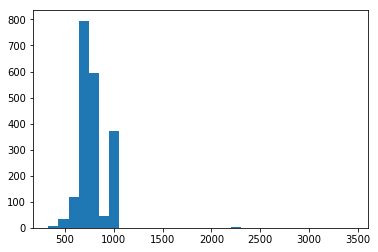

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(hh, bins=30)
plt.show()

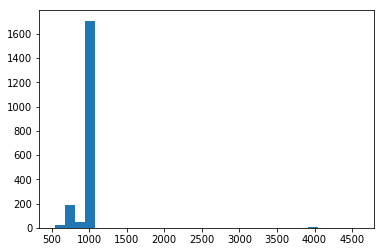

In [13]:
plt.hist(ww, bins=30)
plt.show()

It seems that the pictures are mostly 1000 in height and 650 in width. This is important, we will bring the data during training to this size.

Now we need to rewrite the config, writing there the paths to the pictures, to the annotation and other important details. We will call the new config `faster_rcnn_r50_fpn_1x_our_version.py`, the original one will remain in place so that it can be compared.

Places to pay attention to:
* num_classes = 5 # all available classes need to be numbered from 1, here write the number of classes + 1
* dataset_type = 'CustomDataset'
* data_root = '' # paths to pictures are written in annotations
* imgs_per_gpu = 6 #  select how many pictures fit on your card. If you write too much, there will be errors `RuntimeError: CUDA out of memory`
* workers_per_gpu = 6 # I usually put one worker on 1 picture from the last item
* ann_file = 'annotations_train.pkl' # or some other way, depending on where you start the training team
* img_prefix = '', # paths to pictures are written in annotations
* img_scale = (1000, 650) #  for which we calculated the sizes of the pictures, 1000 is responsible for the long side, 650 for short
* Three paramtra above should be similarly prescribed for all: train, validation, test. For the test there will be None and ''
* optimizer = dict(type='SGD', lr=0.02, momentum=0.9, weight_decay=0.0001) # lr for 8 cards is 0.02, for 2 cards is 0.005, for 1 card is 0.0025
* step=[8, 11] # this is a parameter showing when to reduce lr. For small datasets I set [6, 9] at 12 epochs
* interval=50 # through how many steps intermediate training info is displayed.

If you don’t want to train anything, then you can take the model trained in this tutorial [here](https://drive.google.com/open?id=1O5293UrZ113oQF7AMU6ckeafToSH8Fff 'epoch_1.pth') here and check its results below.

In [14]:
!/home/myltykritik/mmdetection/tools/dist_train.sh\
configs/faster_rcnn_r50_fpn_1x_our_version.py 1 --validate

2019-08-18 10:33:11,521 - INFO - Distributed training: True
2019-08-18 10:33:11,749 - INFO - load model from: torchvision://resnet50
2019-08-18 10:33:11,873 - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2019-08-18 10:33:13,973 - INFO - Start running, host: myltykritik@Ubuntu-1804-bionic-64-minimal, work_dir: /home/myltykritik/DS/Projects/mm_od/work_dirs/faster_rcnn_r50_fpn_1x
2019-08-18 10:33:13,973 - INFO - workflow: [('train', 1)], max: 12 epochs
2019-08-18 10:34:14,147 - INFO - Epoch [1][60/329]	lr: 0.00103, eta: 1:04:58, time: 1.003, data_time: 0.014, memory: 6828, loss_rpn_cls: 0.2594, loss_rpn_bbox: 0.0093, loss_cls: 0.2186, acc: 96.5332, loss_bbox: 0.0576, loss: 0.5449
2019-08-18 10:35:15,358 - INFO - Epoch [1][120/329]	lr: 0.00123, eta: 1:04:31, time: 1.020, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0303, loss_rpn_bbox: 0.0090, loss_cls: 0.1332, acc: 96.9911, loss_bbox: 0.0768, loss: 0.2492
2019-

2019-08-18 10:59:24,339 - INFO - Epoch [5][180/329]	lr: 0.00250, eta: 0:38:36, time: 1.024, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0077, loss_rpn_bbox: 0.0057, loss_cls: 0.0565, acc: 97.7702, loss_bbox: 0.0499, loss: 0.1198
2019-08-18 11:00:25,777 - INFO - Epoch [5][240/329]	lr: 0.00250, eta: 0:37:47, time: 1.024, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0085, loss_rpn_bbox: 0.0062, loss_cls: 0.0672, acc: 97.3541, loss_bbox: 0.0623, loss: 0.1441
2019-08-18 11:01:27,222 - INFO - Epoch [5][300/329]	lr: 0.00250, eta: 0:36:57, time: 1.024, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0094, loss_rpn_bbox: 0.0059, loss_cls: 0.0668, acc: 97.4647, loss_bbox: 0.0544, loss: 0.1366
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 110/110, 12.0 task/s, elapsed: 9s, ETA:     0s

+-------+-----+------+--------+-----------+-------+
| class | gts | dets | recall | precision | ap    |
+-------+-----+------+--------+-----------+-------+
| 1     | 43  | 570  | 0.953  | 0.072     | 0.706 |
| 2     | 20

2019-08-18 11:26:11,777 - INFO - Epoch [10][60/329]	lr: 0.00003, eta: 0:14:27, time: 1.031, data_time: 0.014, memory: 6828, loss_rpn_cls: 0.0060, loss_rpn_bbox: 0.0045, loss_cls: 0.0442, acc: 98.1934, loss_bbox: 0.0444, loss: 0.0991
2019-08-18 11:27:13,120 - INFO - Epoch [10][120/329]	lr: 0.00003, eta: 0:13:32, time: 1.022, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0071, loss_rpn_bbox: 0.0055, loss_cls: 0.0446, acc: 98.1516, loss_bbox: 0.0434, loss: 0.1006
2019-08-18 11:28:13,857 - INFO - Epoch [10][180/329]	lr: 0.00003, eta: 0:12:37, time: 1.012, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0063, loss_rpn_bbox: 0.0052, loss_cls: 0.0474, acc: 98.0425, loss_bbox: 0.0463, loss: 0.1052
2019-08-18 11:29:15,135 - INFO - Epoch [10][240/329]	lr: 0.00003, eta: 0:11:42, time: 1.021, data_time: 0.006, memory: 6828, loss_rpn_cls: 0.0063, loss_rpn_bbox: 0.0051, loss_cls: 0.0468, acc: 98.0935, loss_bbox: 0.0473, loss: 0.1055
2019-08-18 11:30:16,533 - INFO - Epoch [10][300/329]	lr: 0.00003,

Over 12 eras, the model has learned something, mAP is not too good, but tolerable. Check the model in battle on random data from the Internet. Optionally, you can download a test sample from OID and check the quality of the model on it. But our task now is to make a working baseline, not sota, so for now, we can do without big tests.

To visualize the results, we will copy exactly the same code that we already had here before, only now we will write the paths to our config and trained weights.

In [15]:
from mmdet.apis import init_detector, inference_detector

# Standard output of images from mmdetection is slightly rewritten for some flexibility
from utils.viz import show_result

config_file = 'configs/faster_rcnn_r50_fpn_1x_our_version.py'
checkpoint_file = 'work_dirs/faster_rcnn_r50_fpn_1x/epoch_12.pth'

# Loading the model from the config and saved checkpoint, inference to GPU
model = init_detector(config_file, checkpoint_file, device='cuda:0')

In [16]:
!wget https://live.staticflickr.com/118/306939937_ce1b59db0d_b.jpg -O imgs/raccoon_squirrel.jpg
!wget https://i.pinimg.com/originals/0e/48/16/0e4816a958fd44a16fa20d977ae1db03.jpg -O imgs/otters.jpg
!wget https://www.worldatlas.com/r/w728-h425-c728x425/upload/aa/20/6c/shutterstock-382346350.jpg -O imgs/pandas.jpg
!wget https://us.hola.com/imagenes/actualidad/2015102781754/trece-pandas-seis-gemelos-china/0-339-649/pandas1-a.jpg -O imgs/pandas_bad.jpg

--2019-08-18 11:43:55--  https://live.staticflickr.com/118/306939937_ce1b59db0d_b.jpg
Resolving live.staticflickr.com (live.staticflickr.com)... 2600:9000:200c:2400:0:5a51:64c9:c681, 2600:9000:200c:2a00:0:5a51:64c9:c681, 2600:9000:200c:c000:0:5a51:64c9:c681, ...
Connecting to live.staticflickr.com (live.staticflickr.com)|2600:9000:200c:2400:0:5a51:64c9:c681|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 312828 (305K) [image/jpeg]
Saving to: ‘imgs/raccoon_squirrel.jpg’

imgs/raccoon_squirr 100%[===================>] 305.50K  --.-KB/s    in 0.02s   

2019-08-18 11:43:55 (16.3 MB/s) - ‘imgs/raccoon_squirrel.jpg’ saved [312828/312828]

--2019-08-18 11:43:55--  https://i.pinimg.com/originals/0e/48/16/0e4816a958fd44a16fa20d977ae1db03.jpg
Resolving i.pinimg.com (i.pinimg.com)... 2a04:4e42:1b::84, 151.101.12.84
Connecting to i.pinimg.com (i.pinimg.com)|2a04:4e42:1b::84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119088 (116K) [image/jpeg

In [17]:
classes = ['Otter', 'Panda', 'Raccoon', 'Squirrel']

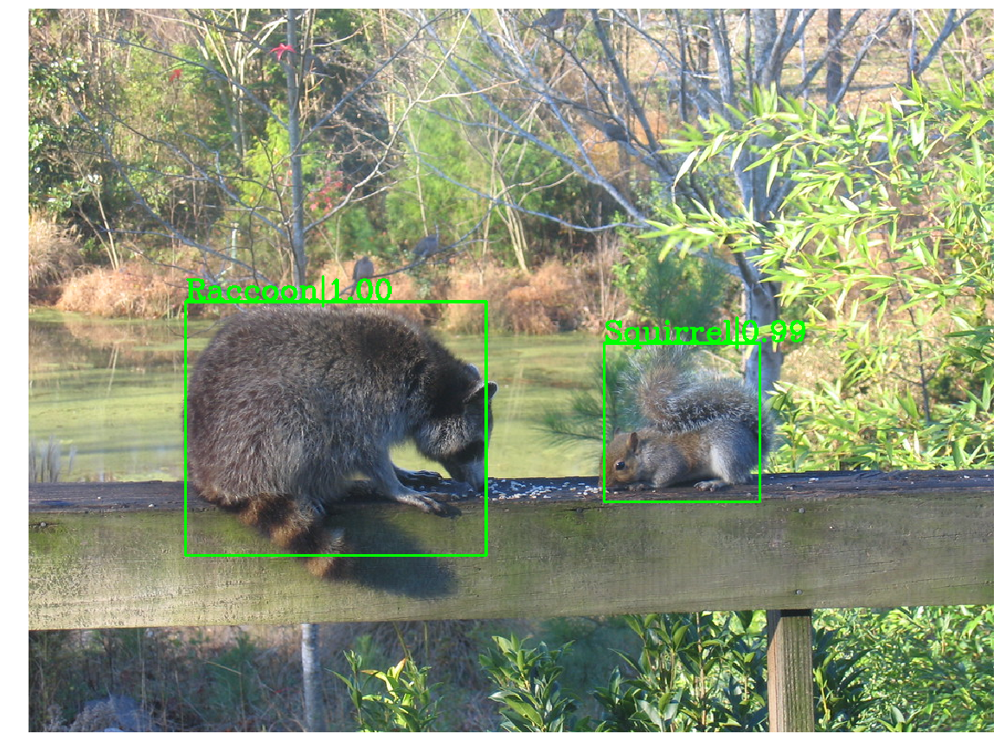

In [18]:
img = 'imgs/raccoon_squirrel.jpg'
result = inference_detector(model, img)
show_result(img, result, classes, score_thr=0.9, font_scale=1., thickness=2, show_mask=False)

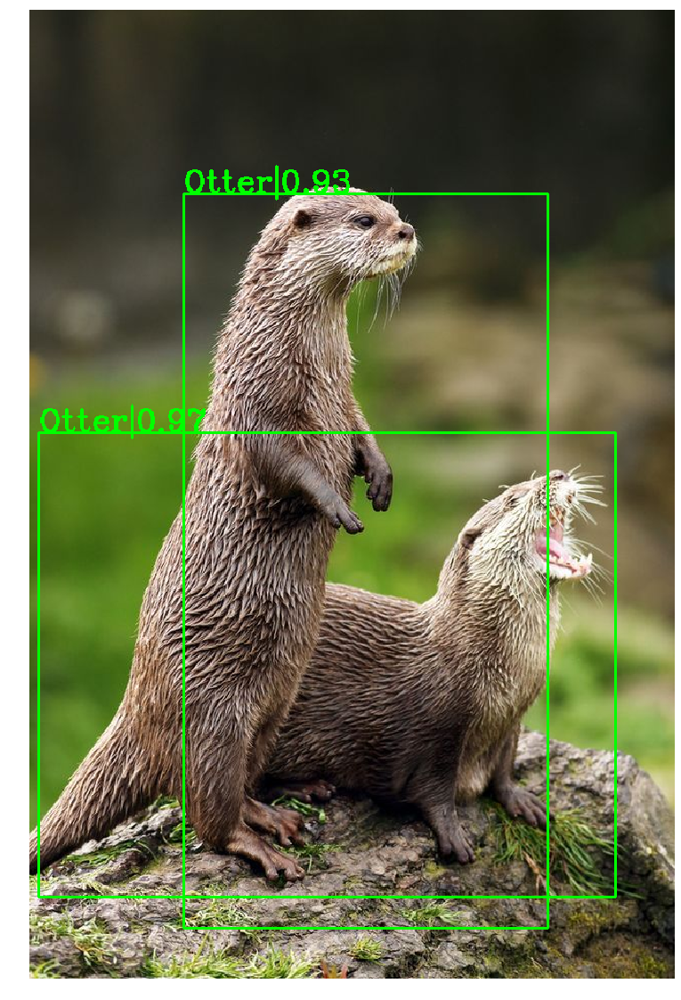

In [19]:
img = 'imgs/otters.jpg'
result = inference_detector(model, img)
show_result(img, result, classes, score_thr=0.9, font_scale=1., thickness=2, show_mask=False)

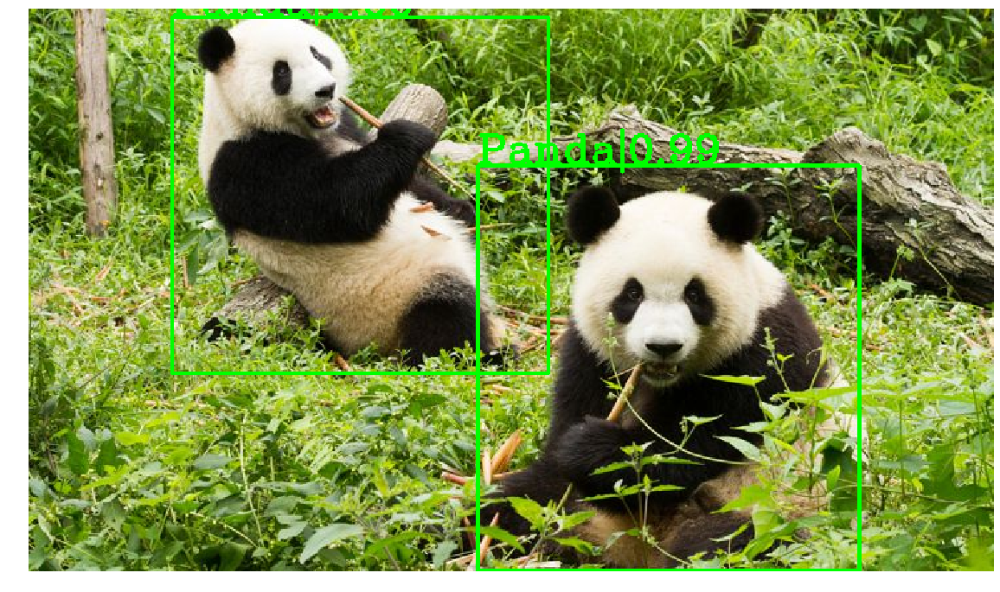

In [20]:
img = 'imgs/pandas.jpg'
result = inference_detector(model, img)
show_result(img, result, classes, score_thr=0.9, font_scale=1., thickness=2, show_mask=False)

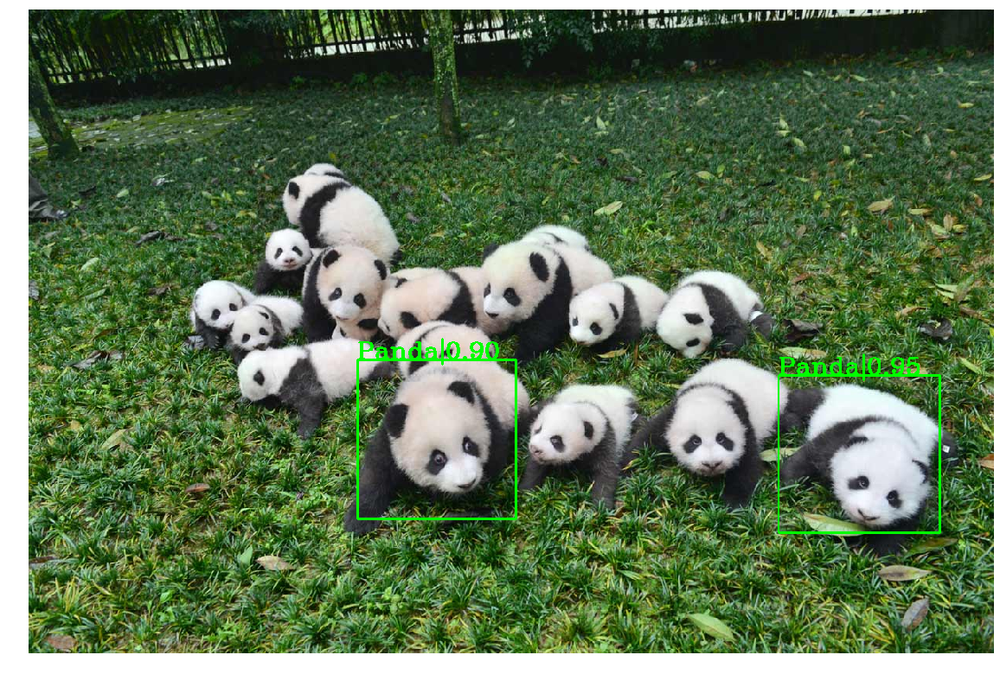

In [21]:
img = 'imgs/pandas_bad.jpg'
result = inference_detector(model, img)
show_result(img, result, classes, score_thr=0.9, font_scale=1., thickness=2, show_mask=False)

If you select good thresholds for detecting objects in the picture, you get a decent result. But the model is still weak, for example, it can’t cope with the picture, where there are more pandas and they are in different poses.

What can be improved?

* Take more tagged pictures. Desirable, much more;
* Take a backbone that goes deeper, for example [faster_rcnn_x101_64x4d_fpn_1x](https://github.com/open-mmlab/mmdetection/blob/master/configs/faster_rcnn_x101_64x4d_fpn_1x.py 'faster_rcnn_x101_64x4d_fpn_1x');
* Or other network architecture;
* Try augmentation, thereby expanding the dataset and making it more diverse;
* Train networks longer and tune parameters.

Now you can use pre-trained models to create your projects and retrain new models on your classes using the various number of pre-trained models.